In [56]:
import pandas as pd
import numpy as np
import missingno as msno
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import calendar

sns.set_theme(style="whitegrid")

# Read Data

In [2]:
train_users_df = pd.read_csv("../data/raw/train_users_2.csv")

In [3]:
train_users_df.head()

,id,date_account_created,timestamp_first_active,date_first_booking,gender,age,signup_method,signup_flow,language,affiliate_channel,affiliate_provider,first_affiliate_tracked,signup_app,first_device_type,first_browser,country_destination
0,gxn3p5htnn,2010-06-28,20090319043255,NaN,-unknown-,NaN,facebook,0,en,direct,direct,untracked,Web,Mac Desktop,Chrome,NDF
1,820tgsjxq7,2011-05-25,20090523174809,NaN,MALE,38.0,facebook,0,en,seo,google,untracked,Web,Mac Desktop,Chrome,NDF
2,4ft3gnwmtx,2010-09-28,20090609231247,2010-08-02,FEMALE,56.0,basic,3,en,direct,direct,untracked,Web,Windows Desktop,IE,US
3,bjjt8pjhuk,2011-12-05,20091031060129,2012-09-08,FEMALE,42.0,facebook,0,en,direct,direct,untracked,Web,Mac Desktop,Firefox,other
4,87mebub9p4,2010-09-14,20091208061105,2010-02-18,-unknown-,41.0,basic,0,en,direct,direct,untracked,Web,Mac Desktop,Chrome,US


## Convert all missing values to np.nan

In [4]:
train_users_df.replace('-unknown-',np.nan, inplace=True)
train_users_df.replace('NaN',np.nan, inplace=True)

## Visualise missing values

<AxesSubplot:>

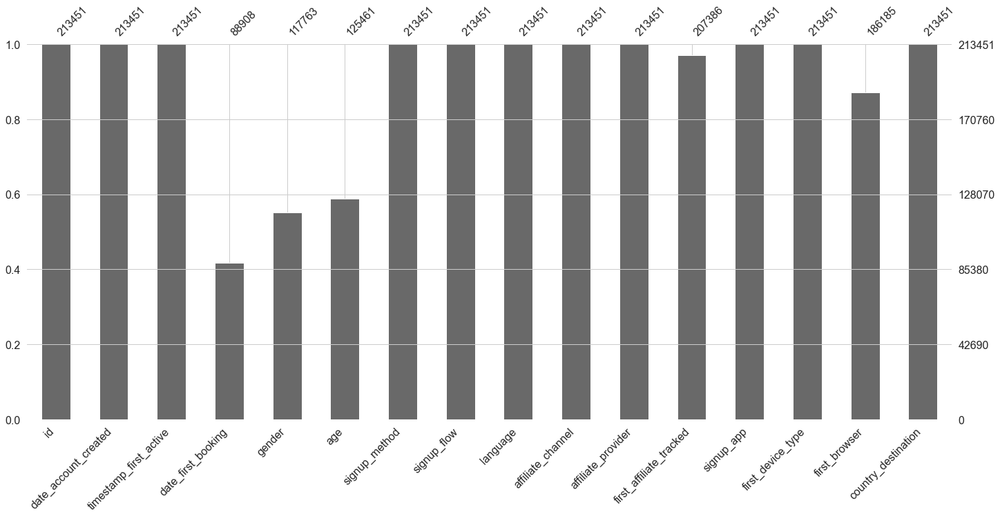

In [5]:
msno.bar(train_users_df)

<AxesSubplot:>

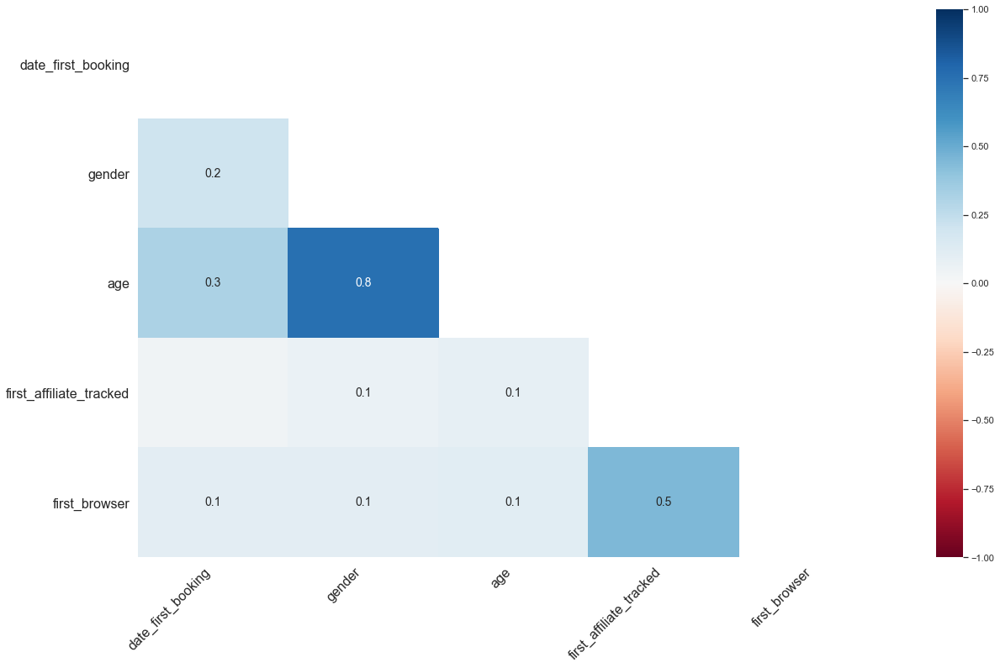

In [6]:
# Shows correlation between missing values
msno.heatmap(train_users_df)

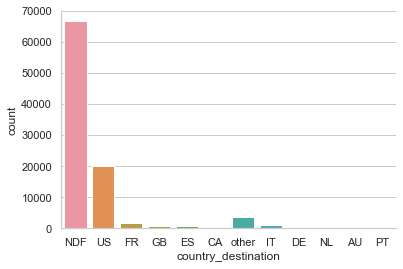

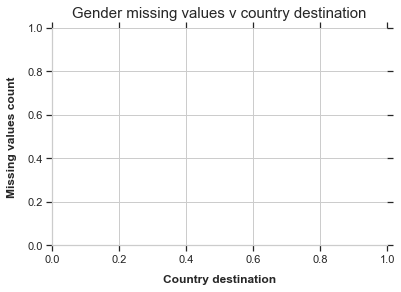

In [7]:
sns.countplot(data=train_users_df.loc[train_users_df['gender'].isnull()], x="country_destination")
sns.despine()
fig,ax = plt.subplots()
title = "Gender missing values v country destination"
ax.set_title(title,pad=10.0,fontdict={'fontsize':15})
ax.set_xlabel("Country destination",weight='bold',size=12,labelpad=10)
ax.set_ylabel("Missing values count",weight='bold',size=12,labelpad=10)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

ax.tick_params(axis="both", which="both", bottom="off", top="off",labelbottom="on", left="off", right="off", labelleft="on")

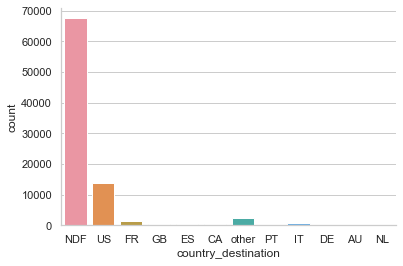

In [8]:
sns.countplot(data=train_users_df.loc[train_users_df['age'].isnull()], x="country_destination")
sns.despine()
title = "Age missing values v country destination"
ax.set_title(title,pad=10.0,fontdict={'fontsize':15})
ax.set_xlabel("Country destination",weight='bold',size=12,labelpad=10)
ax.set_ylabel("Missing values count",weight='bold',size=12,labelpad=10)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

ax.tick_params(axis="both", which="both", bottom="off", top="off",labelbottom="on", left="off", right="off", labelleft="on")

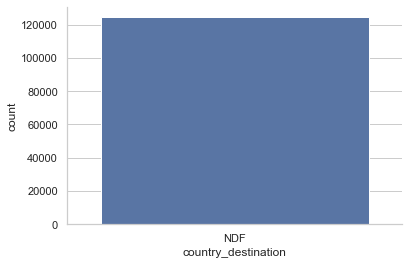

In [9]:
sns.countplot(data=train_users_df.loc[train_users_df['date_first_booking'].isnull()], x="country_destination")
sns.despine()
title = "Date first booking missing values v country destination"
ax.set_title(title,pad=10.0,fontdict={'fontsize':15})
ax.set_xlabel("Country destination",weight='bold',size=12,labelpad=10)
ax.set_ylabel("Missing values count",weight='bold',size=12,labelpad=10)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

ax.tick_params(axis="both", which="both", bottom="off", top="off",labelbottom="on", left="off", right="off", labelleft="on")

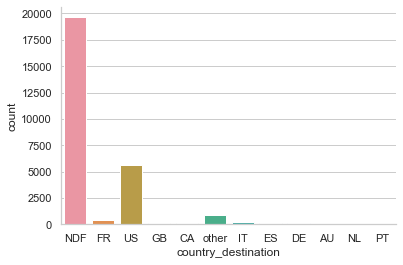

In [10]:
sns.countplot(data=train_users_df.loc[train_users_df['first_browser'].isnull()], x="country_destination")
sns.despine()
title = "First browser missing values v country destination"
ax.set_title(title,pad=10.0,fontdict={'fontsize':15})
ax.set_xlabel("Country destination",weight='bold',size=12,labelpad=10)
ax.set_ylabel("Missing values count",weight='bold',size=12,labelpad=10)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

ax.tick_params(axis="both", which="both", bottom="off", top="off",labelbottom="on", left="off", right="off", labelleft="on")

# Univariate analysis

## Looking at percentage distribution of each feature

In [11]:
def calculate_percentage(demographic_value,values_on):
    fig, ax = plt.subplots()
    fig.set_size_inches(23,8)
    fig.tight_layout(pad=5.0)

    demographic_series = (train_users_df[demographic_value].value_counts() / train_users_df[demographic_value].count()) * 100
    sns.barplot(x=demographic_series.index,y=demographic_series,palette="Set2",ax=ax)
    sns.despine()
    title = demographic_value + " distribution"
    ax.set_title(title,pad=10.0,fontdict={'fontsize':15})
    ax.set_xlabel(demographic_value,weight='bold',size=12,labelpad=10)
    ax.set_ylabel("Total percentage",weight='bold',size=12,labelpad=10)

    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    ax.tick_params(axis="both", which="both", bottom="off", top="off",labelbottom="on", left="off", right="off", labelleft="on")

    if values_on:
        for i in demographic_series.index:
            ax.text(demographic_series.index.get_loc(i), demographic_series[i], round(demographic_series[i],2), color='black', ha="center")

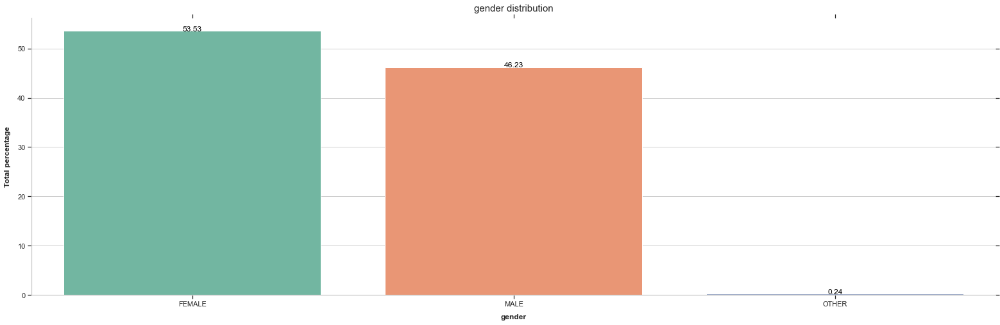

In [12]:
calculate_percentage("gender",True)

Gender values for non-missing values are rather balanced

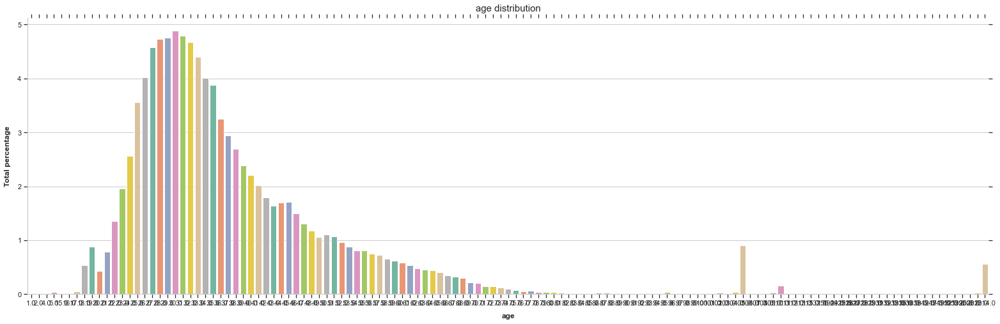

In [13]:
calculate_percentage("age",False)

Clearly some major outliers in this column

/Users/andrea/miniconda3/envs/airbnb/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


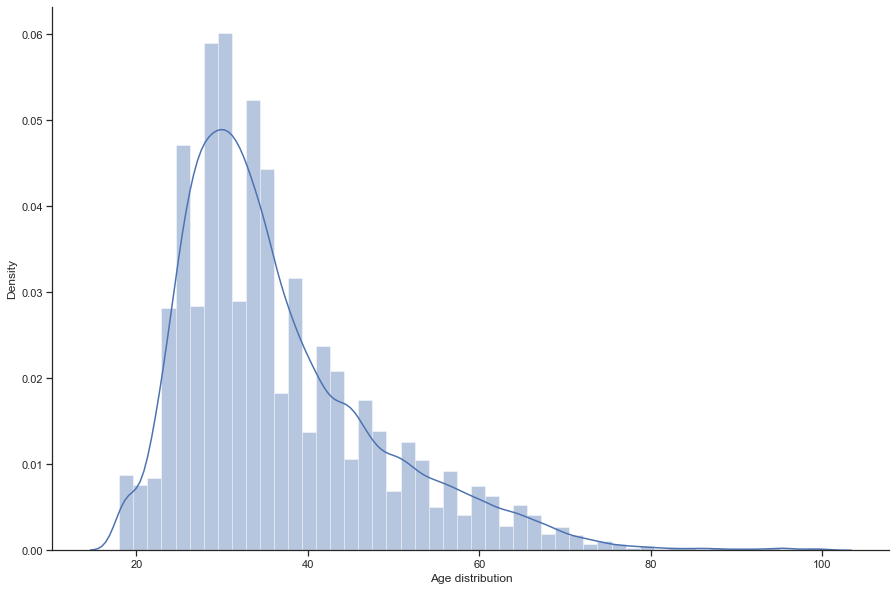

In [15]:
train_users_df['age']=train_users_df['age'].apply(lambda x : np.nan if x>100 or x<18 else x)

sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(15, 10)

sns.distplot(train_users_df['age'].dropna(), ax=ax)
plt.xlabel('Age distribution')
sns.despine()

In [23]:
train_users_df['age'].describe()

count    122958.000000
mean         36.575619
std          11.681366
min          18.000000
25%          28.000000
50%          34.000000
75%          42.000000
max         100.000000
Name: age, dtype: float64

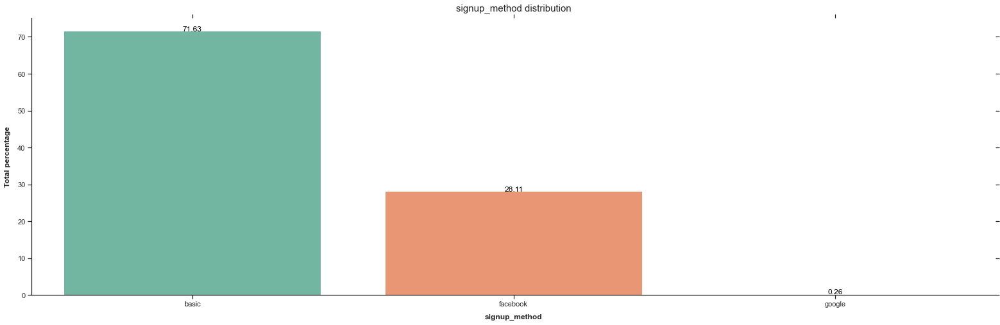

In [24]:
calculate_percentage("signup_method",True)

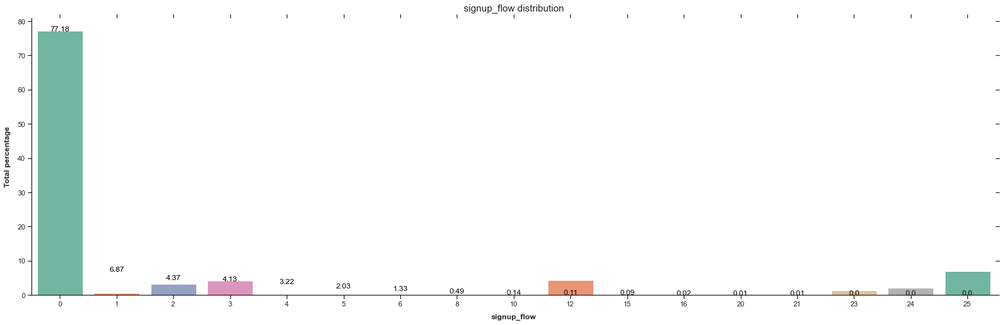

In [25]:
calculate_percentage("signup_flow",True)

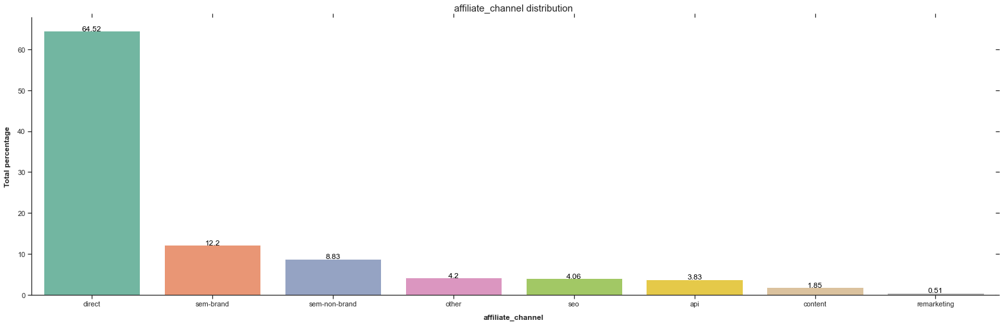

In [26]:
calculate_percentage("affiliate_channel",True)

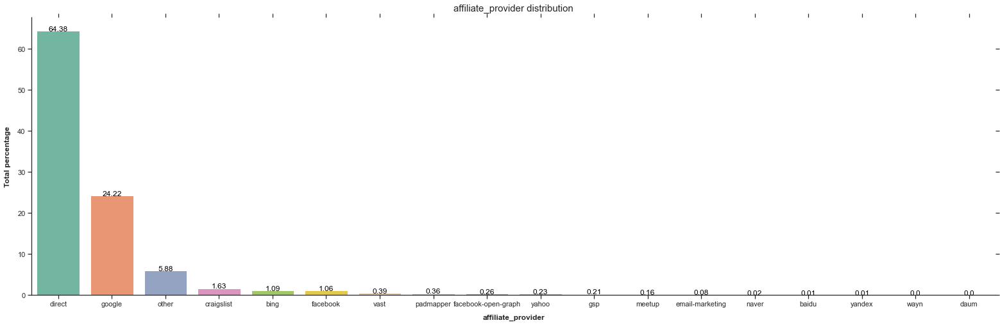

In [27]:
calculate_percentage("affiliate_provider",True)

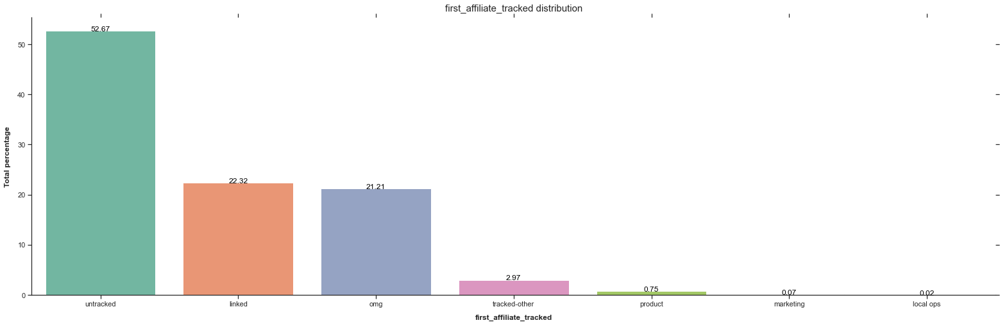

In [28]:
calculate_percentage("first_affiliate_tracked",True)

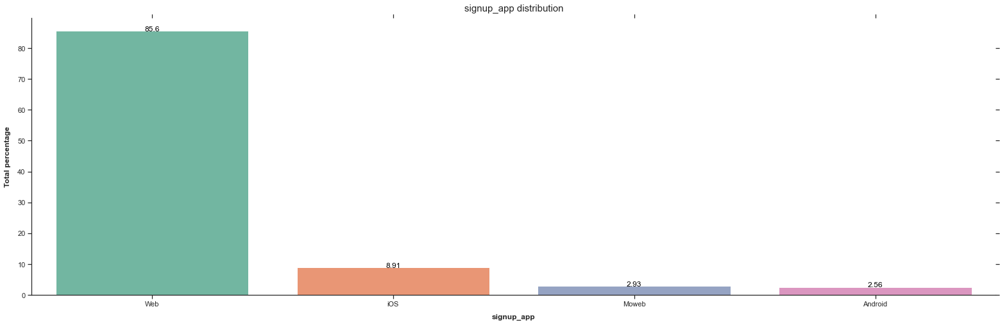

In [29]:
calculate_percentage("signup_app",True)

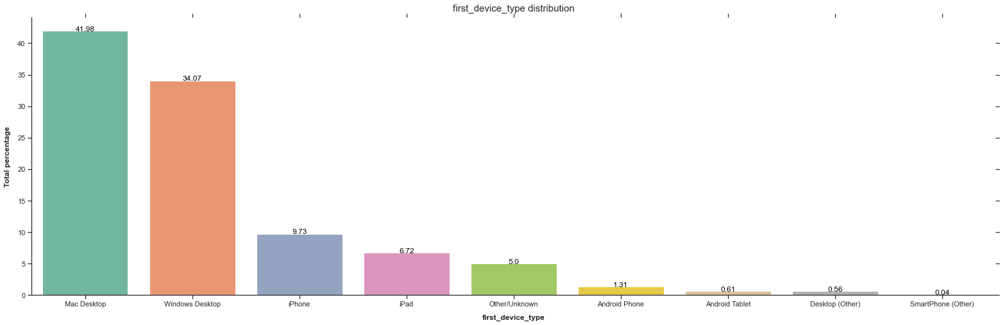

In [30]:
calculate_percentage("first_device_type",True)

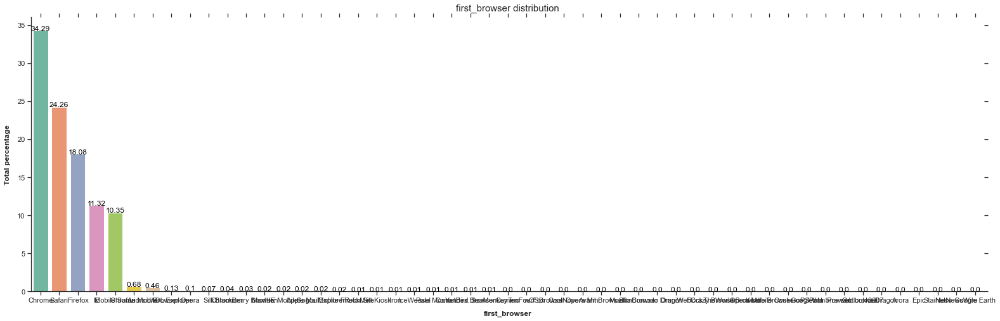

In [31]:
calculate_percentage("first_browser",True)

In [33]:
train_users_df['first_browser'].dropna().value_counts()
# Should probably group the rest with others (only keep top 5)

Chrome                  63845
Safari                  45169
Firefox                 33655
IE                      21068
Mobile Safari           19274
Chrome Mobile            1270
Android Browser           851
AOL Explorer              245
Opera                     188
Silk                      124
Chromium                   73
BlackBerry Browser         53
Maxthon                    46
IE Mobile                  36
Apple Mail                 36
Sogou Explorer             33
Mobile Firefox             30
RockMelt                   24
SiteKiosk                  24
Iron                       17
IceWeasel                  13
Pale Moon                  12
CometBird                  11
Yandex.Browser             11
SeaMonkey                  11
Camino                      9
TenFourFox                  8
wOSBrowser                  6
CoolNovo                    6
Opera Mini                  4
Avant Browser               4
Mozilla                     3
SlimBrowser                 2
Comodo Dra

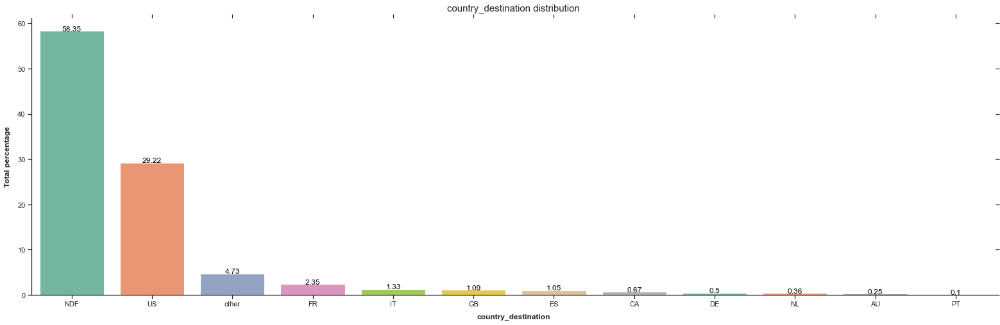

In [34]:
calculate_percentage("country_destination",True)

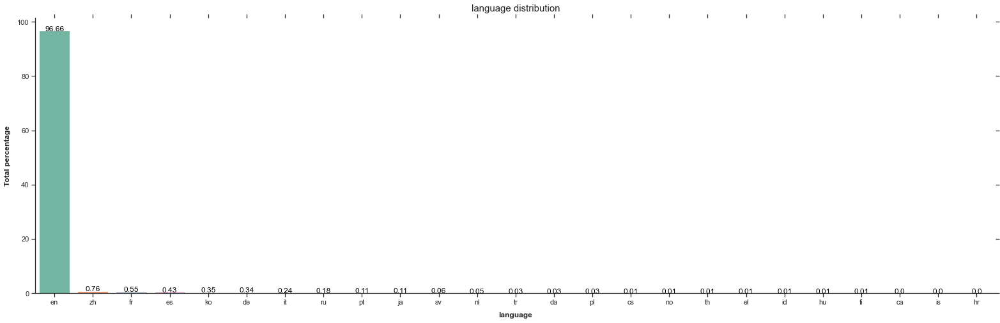

In [35]:
calculate_percentage("language",True)

# Bivariate analysis

## Age v destination country

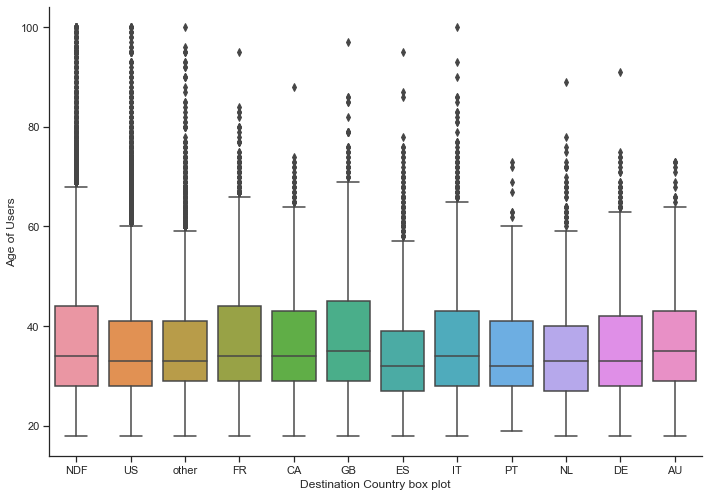

In [36]:
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
sns.boxplot(y='age' , x='country_destination',data=train_users_df)
plt.xlabel('Destination Country box plot')
plt.ylabel('Age of Users')
sns.despine()


## Language v country

In [37]:
english_speaking_countries = ['CA','GB','AU']
languages_ = ["en","fr","es","it","pt","nl","de"]
language_country_dict = {}
train_users_df_2 = train_users_df[train_users_df['country_destination'] != 'US']
train_users_df_2 = train_users_df_2[train_users_df_2['country_destination'] != 'NDF']
train_users_df_2 = train_users_df_2[train_users_df_2['language'] != 'en']

In [38]:
for country in [country for country in train_users_df_2['country_destination'].unique().tolist() if country not in ('NDF','other','US','CA','GB','AU')]:
    same_   = 0
    total_  = 0

    same_  = train_users_df_2.loc[(train_users_df_2['language']==country.lower()) & (train_users_df_2['country_destination']==country)]['id'].count()
    total_ = train_users_df_2.loc[(train_users_df_2['language']==country.lower())]['country_destination'].value_counts().sum()

    language_country_dict[country] = (same_ / total_) * 100

In [39]:
language_country_dict

{'FR': 47.58620689655172,
 'DE': 31.16883116883117,
 'IT': 43.18181818181818,
 'ES': 18.34862385321101,
 'NL': 25.0,
 'PT': 4.761904761904762}

## Country v month booked

In [40]:
train_users_df['date_first_booking'] = pd.to_datetime(train_users_df['date_first_booking'],format="%Y/%m/%d")
train_users_df['month_booking'] = train_users_df['date_first_booking'].dt.month

In [41]:
country_month_df = train_users_df.groupby(['country_destination','month_booking'])['id'].count().reset_index()
# country_month_df = country_month_df.groupby(['country_destination']).apply(lambda x: x['id'] /(x.sum()['id']) * 100).reset_index()

In [42]:
country_month_groups = train_users_df.groupby(['country_destination','month_booking'])['id'].count()
country_month_total  = train_users_df.groupby('country_destination')['id'].count().rename('country_month_total')
country_month_df     = country_month_groups.to_frame().join(country_month_total)
country_month_df     = (country_month_df['id'] / country_month_df['country_month_total'] * 100).rename('percentage').reset_index()
country_month_df     = country_month_df.pivot("month_booking","country_destination","percentage")

In [43]:
country_month_df = country_month_df.rename(index=lambda x: calendar.month_abbr[int(x)])

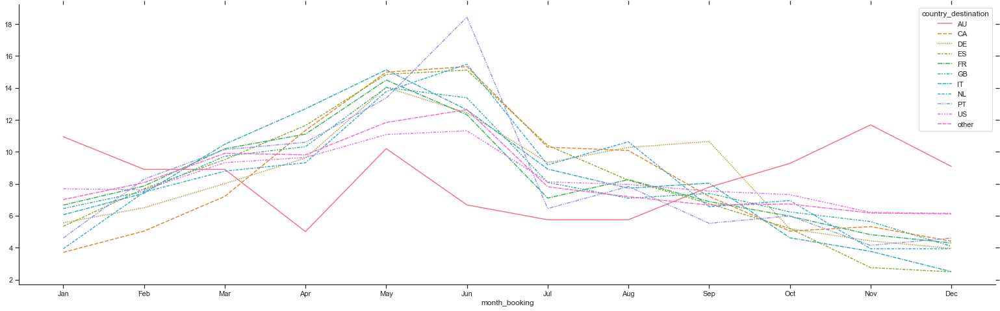

In [44]:
fig, ax = plt.subplots()
fig.set_size_inches(23,8)
fig.tight_layout(pad=5.0)

sns.lineplot(data=country_month_df, ax=ax)
sns.despine()

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.tick_params(axis="both", which="both", bottom="off", top="off",labelbottom="on", left="off", right="off", labelleft="on")


- During the winter months, Australia gets booked more often (summer time there)
- Portugal is popular to book during the start of summer
- The most popular time to book overall is May/June
- Germany is often booked during September


## Countplot function

In [45]:
def countplot_bivariate(x_axis, hue, data):
    fig, ax = plt.subplots()
    fig.set_size_inches(23,8)
    fig.tight_layout(pad=5.0)

    g = sns.countplot(x=x_axis, hue=hue, data=data, palette="Set2")
    sns.despine()
    plt.legend(loc='upper right')

    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.tick_params(axis="both", which="both", bottom="off", top="off",labelbottom="on", left="off", right="off", labelleft="on")

## Language v country destination type

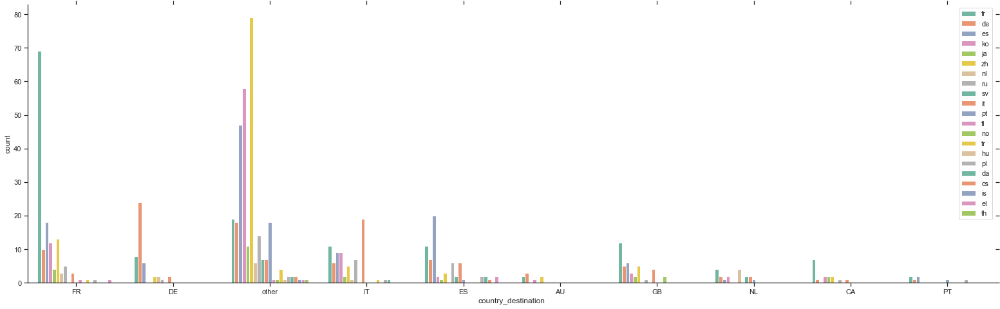

In [46]:
train_users_df_no_ndf = train_users_df[train_users_df['country_destination'] != 'NDF']
train_users_df_no_ndf = train_users_df_no_ndf[train_users_df_no_ndf['country_destination'] != 'US']
train_users_df_no_ndf = train_users_df_no_ndf[train_users_df_no_ndf['language'] != 'en']

countplot_bivariate('country_destination','language',train_users_df_no_ndf)

## Age v first device type

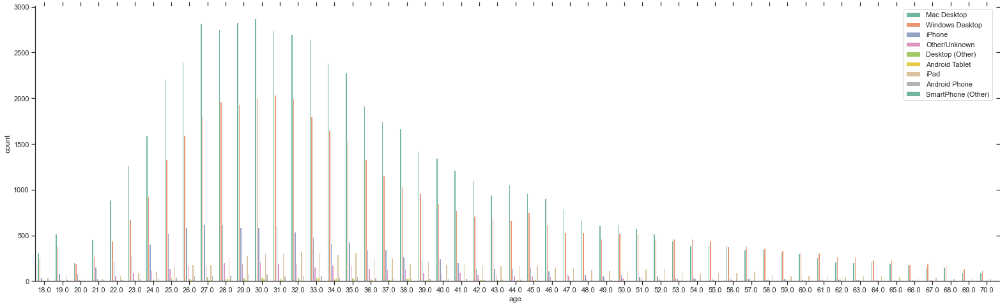

In [47]:
train_users_df_sample_age = train_users_df
train_users_df_sample_age['age']=train_users_df_sample_age['age'].apply(lambda x : np.nan if x>70 or x<18 else x)

countplot_bivariate('age','first_device_type',train_users_df_sample_age)

- Mac Desktop overall more used
- In the older generations, Mac/Windows more balanced, with Windows dominating in certain group ages

## NDF v DF

In [48]:
def get_if_destination(column):
    train_users_df_2 = train_users_df.copy()
    train_users_df_2['country_destination'] = train_users_df_2['country_destination'].apply(lambda x: x if x == "NDF" else "DF")

    if column == "age":
        train_users_df_2['age'] = train_users_df_2['age'].fillna("NAF")
        train_users_df_2['age'] = train_users_df_2['age'].apply(lambda x: x if x =="NAF" else "AF")
    
    if column == "language":
        train_users_df_2['language'] = train_users_df_2['language'].apply(lambda x: x if x =="en" else "other")

    train_users_df_2 = train_users_df_2.groupby([column,"country_destination"],dropna=False)['country_destination'].count().reset_index(name="count")
    train_users_df_2.pivot(index=column,columns="country_destination").plot(kind="bar")

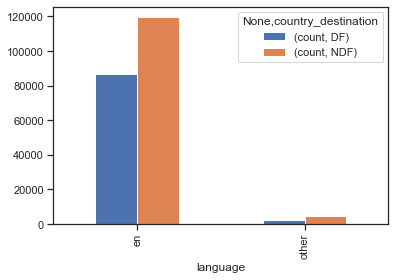

In [49]:
get_if_destination("language")

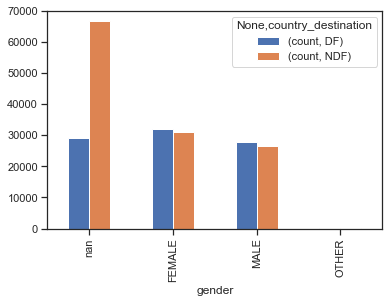

In [50]:
get_if_destination("gender")

- Unknown gender are more likely to not book

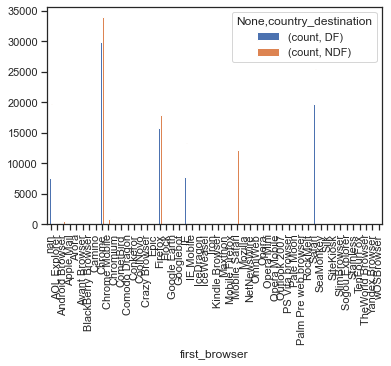

In [51]:
get_if_destination("first_browser")

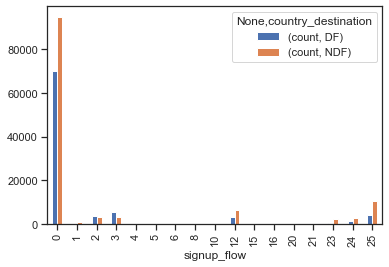

In [52]:
get_if_destination("signup_flow")

<AxesSubplot:xlabel='signup_flow'>

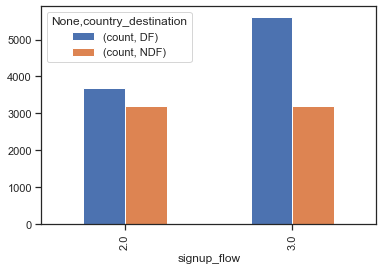

In [53]:
column = "signup_flow"
train_users_df_2 = train_users_df.copy()
train_users_df_2['country_destination'] = train_users_df_2['country_destination'].apply(lambda x: x if x == "NDF" else "DF")

if column == "signup_flow":
    train_users_df_2['signup_flow'] = train_users_df_2['signup_flow'].apply(lambda x: x if (x ==3 or x == 2) else np.nan)

train_users_df_2 = train_users_df_2.groupby([column,"country_destination"],dropna=True)['country_destination'].count().reset_index(name="count")
train_users_df_2.pivot(index=column,columns="country_destination").plot(kind="bar")

Should treat signup flow column as categorical data and one hot encode it

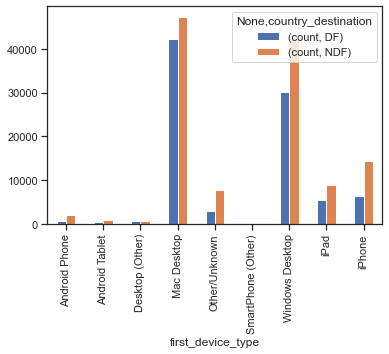

In [54]:
get_if_destination("first_device_type")

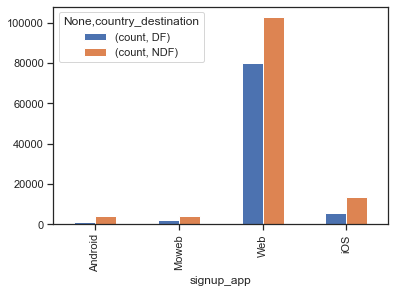

In [55]:
get_if_destination("signup_app")

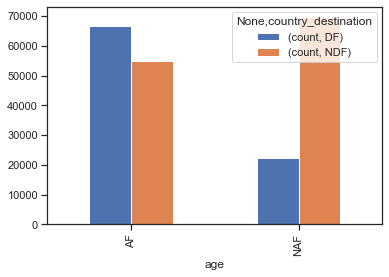

In [47]:
get_if_destination("age")

# Multivariate Analysis

<AxesSubplot:xlabel='dim_1', ylabel='dim_2'>

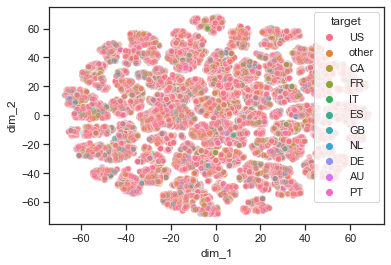

In [48]:
from sklearn.manifold import TSNE
from sklearn import preprocessing

train_df = train_users_df.copy()

train_df['gender'].replace('-unknown-',np.nan, inplace=True)
train_df['age'].replace('NaN', np.nan, inplace=True)
train_df.dropna(inplace=True)
target   = train_df['country_destination']

train_df.drop(['id','date_account_created','date_first_booking','country_destination'],axis=1,inplace=True)

# ------- ENCODING -------
other_cols = ['gender','signup_method','language','affiliate_channel','affiliate_provider','first_affiliate_tracked', 'signup_app','first_device_type','first_browser']

for feature in other_cols:
    label_encoder = preprocessing.LabelEncoder()
    train_df[feature]=label_encoder.fit_transform(train_df[feature])

# ------- NORMALISING -------
scaler = preprocessing.StandardScaler()
train_df=scaler.fit_transform(train_df)

# ------- VISUALISATION -------
perplexitiy_val = 50    # number of nearest neighbours
n_iterations    = 1000
n_components_   = 2
X = train_df

X_tsne  = TSNE(perplexity=perplexitiy_val, n_iter=n_iterations,n_components=n_components_).fit_transform(X)
dim_1 = X_tsne[:,0]
dim_2 = X_tsne[:,1]
tsne_df = pd.DataFrame({'dim_1':dim_1, 'dim_2':dim_2, 'target':target})

sns.scatterplot(data=tsne_df, x='dim_1', y='dim_2', hue='target', alpha=0.3)



# Sessions

In [14]:
sessions_df = pd.read_csv("../data/raw/sessions.csv")
sessions_df.rename(columns={"user_id": "id"},inplace=True)

In [16]:
sessions_df['country_destination'] = sessions_df.merge(train_users_df, on="id")["country_destination"]

In [17]:
countries = ['other', 'NDF', 'GB', 'US', 'FR', 'IT', 'CA', 'AU', 'DE', 'ES','NL','PT']
sessions_df['country_destination'] = sessions_df['country_destination'].apply(lambda x: np.nan if x not in countries else x)
sessions_df = sessions_df[sessions_df['country_destination'].notna()]
#sessions_df = sessions_df.dropna()
sessions_df

,id,action,action_type,action_detail,device_type,secs_elapsed,country_destination
0,d1mm9tcy42,lookup,NaN,NaN,Windows Desktop,319.0,other
1,d1mm9tcy42,search_results,click,view_search_results,Windows Desktop,67753.0,other
2,d1mm9tcy42,lookup,NaN,NaN,Windows Desktop,301.0,other
3,d1mm9tcy42,search_results,click,view_search_results,Windows Desktop,22141.0,other
4,d1mm9tcy42,lookup,NaN,NaN,Windows Desktop,435.0,other
...,...,...,...,...,...,...,...
5537952,dbzfpgoiuc,reviews,data,listing_reviews,iPhone,213.0,NDF
5537953,dbzfpgoiuc,index,-unknown-,-unknown-,iPhone,728.0,NDF
5537954,dbzfpgoiuc,show,-unknown-,-unknown-,iPhone,28.0,NDF
5537955,dbzfpgoiuc,show,view,user_profile,iPhone,381.0,NDF


In [18]:
sessions_df.columns

Index(['id', 'action', 'action_type', 'action_detail', 'device_type',
       'secs_elapsed', 'country_destination'],
      dtype='object')

In [19]:
def calculate_percentage_sessions(demographic_value,values_on=False):
    fig, ax = plt.subplots()
    fig.set_size_inches(23,8)
    fig.tight_layout(pad=5.0)

    demographic_series = (sessions_df[demographic_value].value_counts() / sessions_df[demographic_value].count()) * 100
    sns.barplot(x=demographic_series.index,y=demographic_series,palette="Set2",ax=ax)
    sns.despine()
    title = demographic_value + " distribution"
    ax.set_title(title,pad=10.0,fontdict={'fontsize':15})
    ax.set_xlabel(demographic_value,weight='bold',size=12,labelpad=10)
    ax.set_ylabel("Total percentage",weight='bold',size=12,labelpad=10)

    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    ax.tick_params(axis="both", which="both", bottom="off", top="off",labelbottom="on", left="off", right="off", labelleft="on")

    if values_on:
        for i in demographic_series.index:
            ax.text(demographic_series.index.get_loc(i), demographic_series[i], round(demographic_series[i],2), color='black', ha="center")

In [20]:
def get_if_destination_sessions(column):
    sessions_df_2 = sessions_df.copy()
    sessions_df_2['country_destination'] = sessions_df_2['country_destination'].apply(lambda x: x if x == "NDF" else "DF")

    if column == "action_detail":
        sessions_df_2[column] = sessions_df_2[column].apply(lambda x: x if x =="-unknown-" else "other")


    sessions_df_2 = sessions_df_2.groupby([column,"country_destination"],dropna=False)['country_destination'].count().reset_index(name="count")
    
    sessions_df_2.pivot(index=column,columns="country_destination").plot(kind="bar")

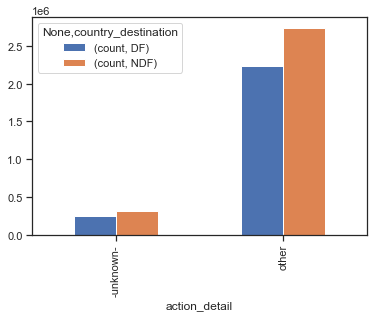

In [21]:
get_if_destination_sessions("action_detail")

In [22]:
sessions_df['empty_vals'] = sessions_df.isna().sum(axis=1).astype(int)

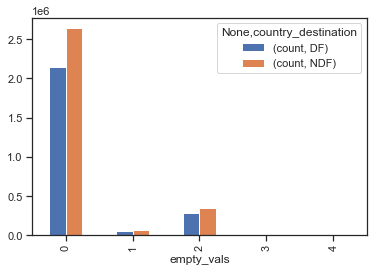

In [32]:
get_if_destination_sessions('empty_vals')